Stiches the output files from the XYZ directories into a continuous file.

Convert each img with their XYZ tile directories into georeferenced tiff and stitch them together.

In [1]:
import urllib.request
import os
from glob import glob
import shutil
from osgeo import gdal
import cv2
import numpy as np
from pathlib import Path
from tqdm import tqdm

from matplotlib import pyplot as plt

#### Create binary masks for flooded areas from merged image of DEM and floodzones

In [2]:
def convert_binary(img_path):
    img = cv2.imread(img_path)
    
    lower = np.array([0, 95, 0])
    lower = np.array([0, 95, 190])
    upper = np.array([179, 255, 255])
    
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(hsv, lower, upper)
    output = cv2.bitwise_and(img, img, mask= mask)
    output = cv2.cvtColor(output, cv2.COLOR_BGR2GRAY)
    _, output = cv2.threshold(output, 20, 255, cv2.THRESH_OTSU)

    kernel = np.ones((2,2),np.uint8)
    output = cv2.dilate(output,kernel,iterations = 1)
    output = cv2.morphologyEx(output, cv2.MORPH_CLOSE, kernel)

    return output

def save_binary(fake_paths):
    for file in tqdm(fake_paths):
        binary_path = file.replace('FAKE', 'FAKE_BINARY')
        dir_path = os.path.dirname(binary_path)
        Path(dir_path).mkdir(parents=True, exist_ok=True) # create subdirs
        
        img = convert_binary(file)

        # alpha_channel = np.where(closing == 255, 255, 0).astype(np.uint8)
        # b_channel = img
        # g_channel = img
        # r_channel = img
        #rgba_image = cv2.merge((b_channel, g_channel, r_channel, alpha_channel))
                
        cv2.imwrite(binary_path, img, [cv2.IMWRITE_PNG_COMPRESSION, 0])


<>:2: SyntaxWarning: invalid escape sequence '\d'
<>:2: SyntaxWarning: invalid escape sequence '\d'
C:\Users\abraham\AppData\Local\Temp\ipykernel_21072\1791500921.py:2: SyntaxWarning: invalid escape sequence '\d'
  img1 = '..\datasets\\USA\\MITest\\FAKE\\11\\534\\757.png'


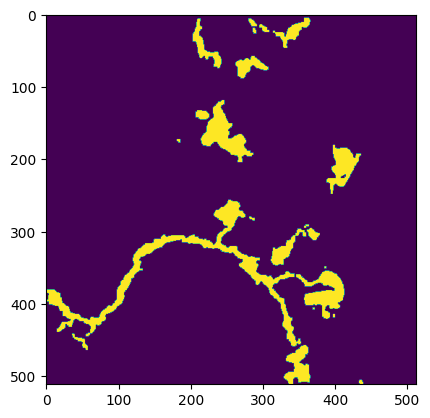

In [9]:
# running to test the script
img1 = '..\datasets\\USA\\MITest\\FAKE\\11\\534\\757.png'
img_fake = convert_binary(img1)
kernel = np.ones((2,2),np.uint8)
dilation = cv2.dilate(img_fake,kernel,iterations = 1)
img_fake = cv2.morphologyEx(dilation, cv2.MORPH_CLOSE, kernel)

plt.imshow(img_fake)
plt.show()

In [ ]:
# extract the flood mask from the generated images
fake_paths = glob(r'..\datasets\\USA\\02Tiles\\FAKE\\13\\*\\*.png')      
save_binary(fake_paths)

#### Convert the flood mask images to GeoTIFF format

In [72]:
from math import log, tan, radians, cos, pi, floor, degrees, atan, sinh

def sec(x):
    return(1/cos(x))

def latlon_to_xyz(lat, lon, z):
    tile_count = pow(2, z)
    x = (lon + 180) / 360
    y = (1 - log(tan(radians(lat)) + sec(radians(lat))) / pi) / 2
    return(tile_count*x, tile_count*y)

def bbox_to_xyz(lon_min, lon_max, lat_min, lat_max, z):
    x_min, y_max = latlon_to_xyz(lat_min, lon_min, z)
    x_max, y_min = latlon_to_xyz(lat_max, lon_max, z)
    return(floor(x_min), floor(x_max),
           floor(y_min), floor(y_max))
    
def x_to_lat_edges(x, z):
    tile_count = pow(2, z)
    unit = 360 / tile_count
    lon1 = -180 + x * unit
    lon2 = lon1 + unit
    return(lon1, lon2)
    
def mercatorToLat(mercatorY):
    return(degrees(atan(sinh(mercatorY))))

def y_to_lat_edges(y, z):
    tile_count = pow(2, z)
    unit = 1 / tile_count
    relative_y1 = y * unit
    relative_y2 = relative_y1 + unit
    lat1 = mercatorToLat(pi * (1 - 2 * relative_y1))
    lat2 = mercatorToLat(pi * (1 - 2 * relative_y2))
    return(lat1, lat2)

def x_to_lon_edges(x, z):
    tile_count = pow(2, z)
    unit = 360 / tile_count
    lon1 = -180 + x * unit
    lon2 = lon1 + unit
    return(lon1, lon2)

def tms_to_xyz(y, max_tiles):
    return max_tiles - 1 - y

def tile_edges(x, y, z, tms=False):

    if tms == True:
        # flip ytile from TMS to XYZ
        y = tms_to_xyz(y, 2 ** z)

    lat1, lat2 = y_to_lat_edges(y, z)
    lon1, lon2 = x_to_lon_edges(x, z)
    return[lon1, lat1, lon2, lat2]
    
def get_xyz(path):
    """get x, y, z from file path"""
    # dir structure path\z\x\y.png
    parts = path.split("\\")
    z = int(parts[-3])
    x = int(parts[-2])
    y = int(parts[-1].split(".")[0])
    
    return x, y, z


In [ ]:
zoom = '12'
xyz_dir = "..\datasets\\USA\\02Tiles\\FAKE_BINARY"
tiff_dir = "..\datasets\\USA\\02Tiles\\tiffs"
merged_dir = "..\datasets\\USA\\02Tiles\\"

if not os.path.exists(tiff_dir):
    os.makedirs(tiff_dir)

if not os.path.exists(merged_dir):
    os.makedirs(merged_dir)

# convert imgs under xyz_dir to georeferenced tiffs
file_list = glob(xyz_dir + f'\\{zoom}\*\*.png', recursive=True)
print(f"{len(file_list)} files found")
for source_path in file_list:
    x,y,z = get_xyz(source_path)
    bounds = tile_edges(x, y, z)
    gdal.Translate(os.path.join(tiff_dir, f'{tiff_dir}/{x}_{y}_{z}.tif'), # destination
                   source_path, # source
                   outputSRS='EPSG:4326',
                   outputBounds=bounds,)
    
# merge all tiffs into one file
tiff_list = glob(tiff_dir + '/*.tif')    
print(tiff_list)
merged_file = merged_dir + '/generatedfloodmap.tif'
vrt_path = tiff_dir + "/tiles.vrt"

gdal.BuildVRT(vrt_path, tiff_list)
translate_options = gdal.TranslateOptions(format = 'GTiff',
                                          creationOptions = ['COMPRESS=LZW']
                                          )
gdal.Translate(merged_file, vrt_path, options=translate_options)

['D:\\FloodGen\\datasets\\USA\\02Tiles\\tiffs\\1000_1389_12.tif', 'D:\\FloodGen\\datasets\\USA\\02Tiles\\tiffs\\1000_1390_12.tif', 'D:\\FloodGen\\datasets\\USA\\02Tiles\\tiffs\\1000_1391_12.tif', 'D:\\FloodGen\\datasets\\USA\\02Tiles\\tiffs\\1000_1392_12.tif', 'D:\\FloodGen\\datasets\\USA\\02Tiles\\tiffs\\1000_1393_12.tif', 'D:\\FloodGen\\datasets\\USA\\02Tiles\\tiffs\\1000_1394_12.tif', 'D:\\FloodGen\\datasets\\USA\\02Tiles\\tiffs\\1000_1395_12.tif', 'D:\\FloodGen\\datasets\\USA\\02Tiles\\tiffs\\1000_1396_12.tif', 'D:\\FloodGen\\datasets\\USA\\02Tiles\\tiffs\\1000_1397_12.tif', 'D:\\FloodGen\\datasets\\USA\\02Tiles\\tiffs\\1000_1398_12.tif', 'D:\\FloodGen\\datasets\\USA\\02Tiles\\tiffs\\1000_1399_12.tif', 'D:\\FloodGen\\datasets\\USA\\02Tiles\\tiffs\\1000_1400_12.tif', 'D:\\FloodGen\\datasets\\USA\\02Tiles\\tiffs\\1000_1401_12.tif', 'D:\\FloodGen\\datasets\\USA\\02Tiles\\tiffs\\1000_1402_12.tif', 'D:\\FloodGen\\datasets\\USA\\02Tiles\\tiffs\\1000_1403_12.tif', 'D:\\FloodGen\\datasets\

<osgeo.gdal.Dataset; proxy of <Swig Object of type 'GDALDatasetShadow *' at 0x0000019D54349020> >